## Data evaluation

In [49]:
%reload_ext autoreload
%autoreload 2
# check data path
import os, sys
path=os.path.abspath(os.getcwd())
sys.path.append('../../../driver')
sys.path.append('../../messungen')

import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import fmr_eva as fmr_eva
import fmr_eva2 as fmr_eva2

sys.path.append('../driver')
import FMR_Reader_v210208 as FMR_Reader
import FMR_Evaluator_v210208 as FMR_eva
import corporate_design_colors_v3 as cpd


# help(FMR_Reader)

In [30]:
dataset='BF Cobulky32nm LONG'
d=FMR_Reader.read(dataset,loc='../../../messungen/')

100%|██████████| 5201/5201 [01:17<00:00, 67.44it/s]


In [50]:
np.shape(d['S21'])

(153, 5201)

In [51]:
db=FMR_eva.complex_binning(d, Hmin=0, Hmax=1, NH=1000)

In [52]:
dn=FMR_eva.normS21(db, Hnorm='max')

In [53]:
H=dn['H']
S21=dn['S21']
f=dn['f']
w=2*np.pi*f
B=H

In [54]:
Hm,fm=np.meshgrid(np.mean(dn["S21"].real, axis=0),np.mean(dn["S21"].real, axis=1))

<Figure size 2400x1440 with 0 Axes>

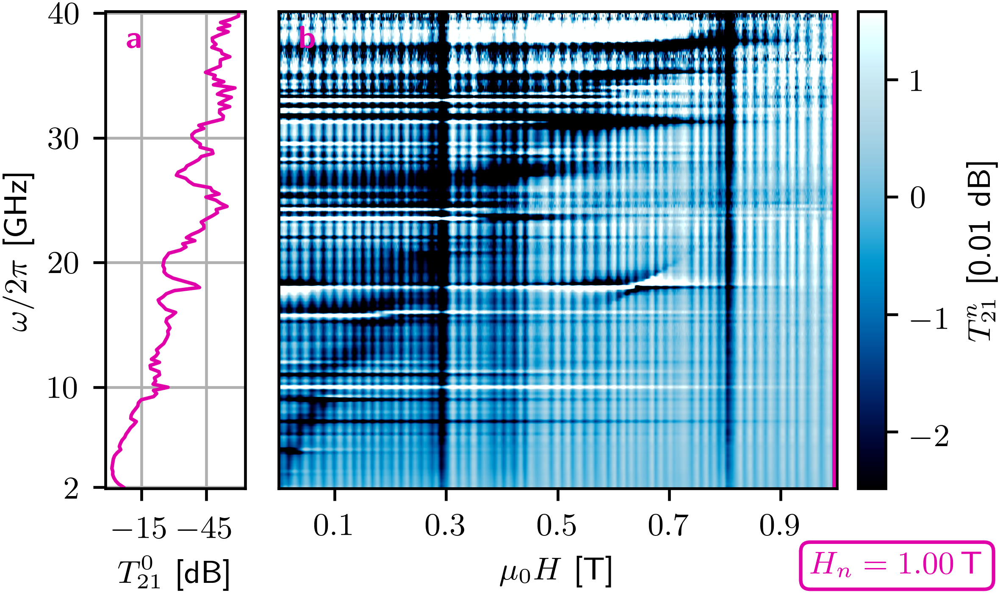

In [67]:

mpl.style.use('thesis_small.mplstyle')

img=20*np.log10(np.abs(dn['S21']))*100
norm=20*np.log10(np.abs(dn['S21norm']))
posN=dn['Hnorm']
H=db['H']
freq=db['f']

Hlim=(-1.5,1.5)
flim=(0,40)
contrast=1
fig_nr=0

xlabel='$\mu_0H$ [T]'
ylabel='$\omega/2\pi$ [GHz]'
nlabel='$T_{21}^0$ [dB]'
clabel='$T^n_{21}$ [0.01 dB]'
normticks=[0,-40]
filename=False
subpath=False
    
# correct image framing
stepsizeH=np.abs(H[0]-H[1])/2
stepsizef=np.abs(freq[-1]-freq[-2])/2
Hind=[np.abs(H-Hlim[0]).argmin(),
      np.abs(H-Hlim[1]).argmin()+1]
find=[np.abs(freq-flim[0]).argmin(),
      np.abs(freq-flim[1]).argmin()+1]
img=img[find[0]:find[1],
        Hind[0]:Hind[1]]
ext=[H[Hind[0]]-stepsizeH,
     H[Hind[1]-1]+stepsizeH,
     freq[find[0]]-stepsizef,
     freq[find[1]-1]+stepsizef]
freq=freq[find[0]:find[1]]
H=H[Hind[0]:Hind[1]]

img[img==-np.inf]=np.nan
img[img==np.inf]=np.nan
clim=(np.nanmean(img)-contrast*np.nanstd(img),
      np.nanmean(img)+contrast*np.nanstd(img))

plt.close(fig_nr)
fig=plt.figure(fig_nr)

fig, (ax_norm, ax_img, ax_clb) = plt.subplots(ncols=3,
                                    gridspec_kw={"width_ratios":[1,4,.2]},
                                    constrained_layout=True)        

norm=norm[find[0]:find[1]]
ax_norm.plot(norm,freq,c=cpd.curves(color='magenta')(1))       
ax_norm.set_ylabel(ylabel)
ax_norm.set_xlabel(nlabel)
ax_norm.set_ylim(ext[2],ext[3])
ax_norm.grid()
ax_norm.invert_xaxis()

nlim=[np.min(norm),np.max(norm)]
enn=np.abs(nlim[1]-nlim[0])/4
nlim=np.around(([(nlim[0]+enn)*2,(nlim[1]-enn)*2]),decimals=-1)/2
ax_norm.set_xticks(nlim)
ax_norm.set_yticks([40,30,20,10,2])

# Take care of image and colorbar   
ax_img.set_yticks([])
ax_img.set_yticklabels([])
im = ax_img.imshow(img, 
                   extent=ext, 
                   aspect='auto',
                   origin='lower',
                   clim=clim,
                   cmap=cpd.images())
ax_img.set_xlabel(xlabel)
ax_img.vlines(posN, ymin=ext[2], ymax=ext[3], lw=2.5,
             color=cpd.curves(color='magenta')(1),
             label="$H_n=%3.2f\,$T"%float(posN))

#ax_norm.text(nlim[0],ext[2]+(ext[3]-ext[2])/20, rotation='vertical',
fig.text(.805,.045,
            "$H_n=%3.2f\,$T"%float(posN),
            color=cpd.curves(color='magenta')(1),
            bbox=dict(facecolor='white', 
                      edgecolor=cpd.curves(color='magenta')(1), 
                      boxstyle='round'))
#ax_clb.set_xticks([0])
# ax_clb.set_xlabel("$H_n=%3.2f\,$T"%float(posN),
#              color=cpd.curves(color='seeblau')(1))

ax_img.set_xticks(np.linspace(.1,.9,5))
ax_img.set_xticks(list(ax_img.get_xticks()))
#ax_img.get_xticklabels()[-1].set_color(cpd.images(color='magenta')(.5))

ax_img.set_xlim(ext[0],ext[1])
ax_img.set_ylim(ext[2],ext[3])

ax_norm.annotate(r'\textbf{a}',xy=(0, 1), xycoords='axes fraction',xytext=(50, -100),color=cpd.curves(color='magenta')(1),
                  textcoords='offset pixels',horizontalalignment='left',verticalalignment='bottom')
ax_img.annotate(r'\textbf{b}',xy=(0, 1), xycoords='axes fraction',xytext=(50, -100),color=cpd.curves(color='magenta')(1),
                  textcoords='offset pixels',horizontalalignment='left',verticalalignment='bottom')

fig.colorbar(im,label=clabel, cax=ax_clb)

fig.savefig('raw.pgf')

(61, 81) (61, 81) (61, 81)


<Figure size 2040x1440 with 0 Axes>

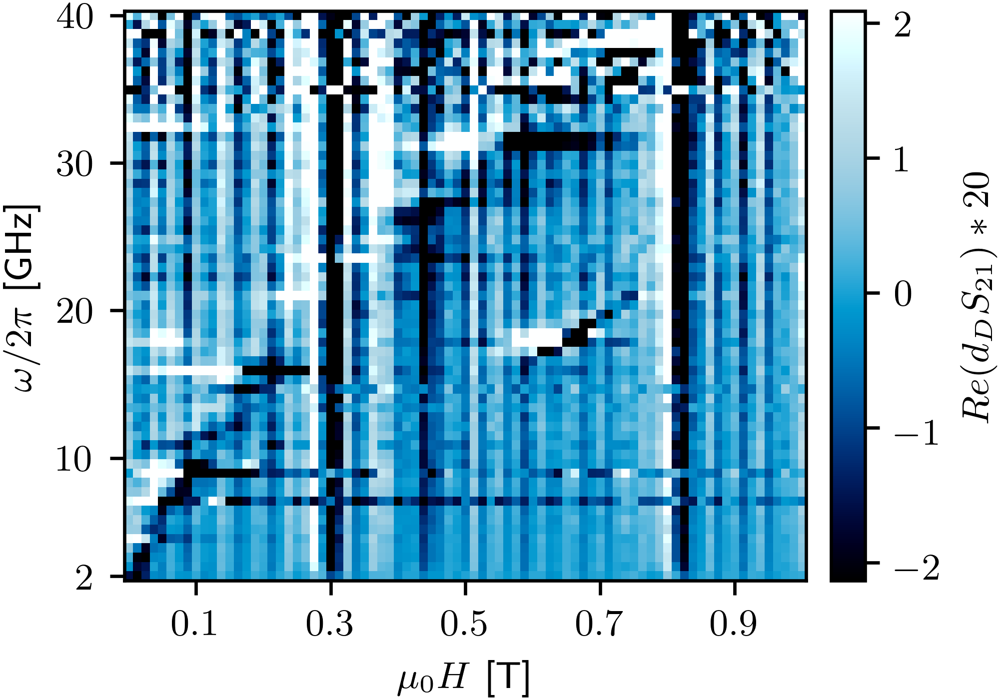

In [56]:
db=FMR_eva.complex_binning(d, Hmin=0, Hmax=1, NH=81, Nf=61)
S21=db['S21']
mpl.style.use('thesis_smaller.mplstyle')

S21p=np.concatenate(([S21[:,0].T],S21[:,0:-1].T),axis=0).T
S21m=np.concatenate((S21[:,1:].T,[S21[:,-1].T]),axis=0).T

print(np.shape(S21),np.shape(S21p),np.shape(S21m))

H=db['H']
freq=db['f']
ddS21=(S21p-S21m)/S21/np.abs(H[0]-H[1])

img=np.real(ddS21)*20
norm=20*np.log10(np.abs(dn['S21norm']))
posN=dn['Hnorm']

Hlim=(-1.5,1.5)
flim=(0,40)
contrast=1
fig_nr=0

xlabel='$\mu_0H$ [T]'
ylabel='$\omega/2\pi$ [GHz]'
nlabel='$T_{21}^0$ [dB]'
clabel='$Re(d_DS_{21})*20$'
normticks=[0,-40]
filename=False
subpath=False
    
# correct image framing
stepsizeH=np.abs(H[0]-H[1])/2
stepsizef=np.abs(freq[-1]-freq[-2])/2
Hind=[np.abs(H-Hlim[0]).argmin(),
      np.abs(H-Hlim[1]).argmin()+1]
find=[np.abs(freq-flim[0]).argmin(),
      np.abs(freq-flim[1]).argmin()+1]
img=img[find[0]:find[1],
        Hind[0]:Hind[1]]
ext=[H[Hind[0]]-stepsizeH,
     H[Hind[1]-1]+stepsizeH,
     freq[find[0]]-stepsizef,
     freq[find[1]-1]+stepsizef]
freq=freq[find[0]:find[1]]
H=H[Hind[0]:Hind[1]]

img[img==-np.inf]=np.nan
img[img==np.inf]=np.nan
clim=(np.nanmean(img)-contrast*np.nanstd(img),
      np.nanmean(img)+contrast*np.nanstd(img))

plt.close(fig_nr)
fig=plt.figure(fig_nr)

fig, (ax_img, ax_clb) = plt.subplots(ncols=2,
                                    gridspec_kw={"width_ratios":[4,.2]},
                                    constrained_layout=True)        

ax_img.set_ylabel(ylabel)
im = ax_img.imshow(img, 
                   extent=ext, 
                   aspect='auto',
                   origin='lower',
                   clim=clim,
                   cmap=cpd.images())
ax_img.set_xlabel(xlabel)

ax_img.set_xticks(np.linspace(.1,.9,5))
ax_img.set_xticks(list(ax_img.get_xticks()))

ax_img.set_xlim(ext[0],ext[1])
ax_img.set_ylim(ext[2],ext[3])
ax_img.set_yticks([40,30,20,10,2])


fig.colorbar(im,label=clabel, cax=ax_clb)

fig.savefig('dd.pgf')

<Figure size 2040x1440 with 0 Axes>

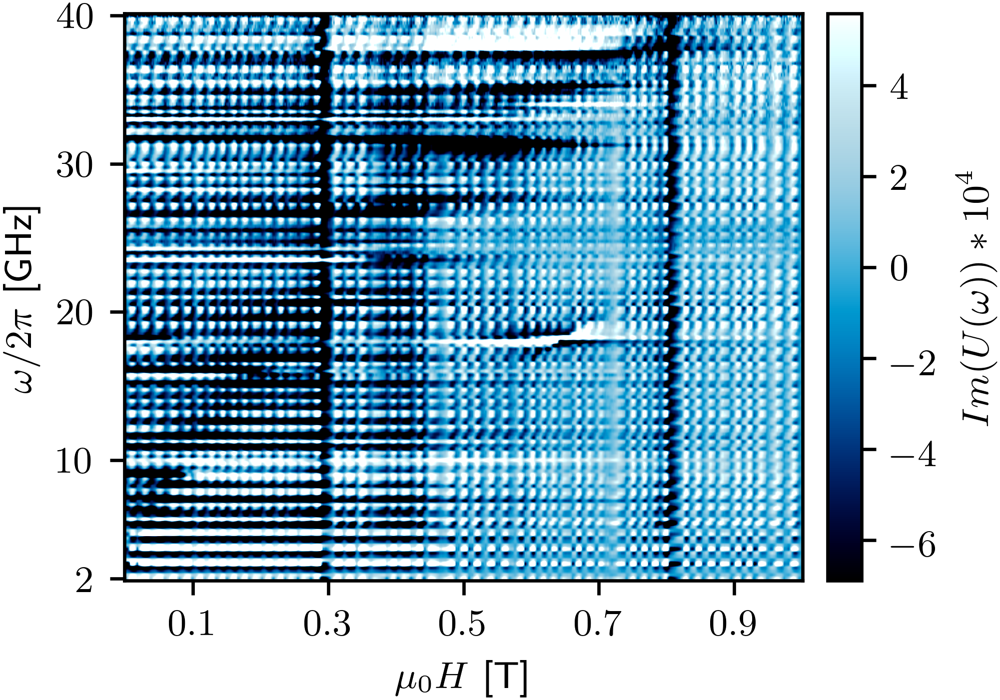

In [57]:

mpl.style.use('thesis_smaller.mplstyle')

db=FMR_eva.complex_binning(d, Hmin=0, Hmax=1, NH=500)

B0=.11
S21=db['S21']
B=db['H']
f=db['f']
nS21=S21[:,-1]
x=np.ones(np.shape(S21)[1])
xx,nnS21=np.meshgrid(x,nS21)

fmax=40
fmin=0
flim=[np.argmin(np.abs(f-fmin)),np.argmin(np.abs(f-fmax))]

U=-1j*np.log(S21/nnS21)/np.log(nnS21)
wholeU=U
f=f[flim[0]:flim[1]]
U=U[flim[0]:flim[1],np.argmin(np.abs(H-B0))]


img=np.imag(wholeU)*10000
norm=20*np.log10(np.abs(dn['S21norm']))
posN=dn['Hnorm']
H=db['H']
freq=db['f']

Hlim=(-1.5,1.5)
flim=(0,40)
contrast=1
fig_nr=0

xlabel='$\mu_0H$ [T]'
ylabel='$\omega/2\pi$ [GHz]'
nlabel='$T_{21}^0$ [dB]'
clabel='$Im(U(\omega))*10^4$'
normticks=[0,-40]
filename=False
subpath=False
    
# correct image framing
stepsizeH=np.abs(H[0]-H[1])/2
stepsizef=np.abs(freq[-1]-freq[-2])/2
Hind=[np.abs(H-Hlim[0]).argmin(),
      np.abs(H-Hlim[1]).argmin()+1]
find=[np.abs(freq-flim[0]).argmin(),
      np.abs(freq-flim[1]).argmin()+1]
img=img[find[0]:find[1],
        Hind[0]:Hind[1]]
ext=[H[Hind[0]]-stepsizeH,
     H[Hind[1]-1]+stepsizeH,
     freq[find[0]]-stepsizef,
     freq[find[1]-1]+stepsizef]
freq=freq[find[0]:find[1]]
H=H[Hind[0]:Hind[1]]

img[img==-np.inf]=np.nan
img[img==np.inf]=np.nan
clim=(np.nanmean(img)-contrast*np.nanstd(img),
      np.nanmean(img)+contrast*np.nanstd(img))

plt.close(fig_nr)
fig=plt.figure(fig_nr)

fig, (ax_img, ax_clb) = plt.subplots(ncols=2,
                                    gridspec_kw={"width_ratios":[4,.2]},
                                    constrained_layout=True)        

ax_img.set_ylabel(ylabel)
im = ax_img.imshow(img, 
                   extent=ext, 
                   aspect='auto',
                   origin='lower',
                   clim=clim,
                   cmap=cpd.images())
ax_img.set_xlabel(xlabel)

ax_img.set_xticks(np.linspace(.1,.9,5))
ax_img.set_xticks(list(ax_img.get_xticks()))

ax_img.set_xlim(ext[0],ext[1])
ax_img.set_ylim(ext[2],ext[3])

ax_img.set_yticks([40,30,20,10,2])


fig.colorbar(im,label=clabel, cax=ax_clb)

fig.savefig('U.pgf')

In [39]:
dataset='BF Cobulky32nm LONG'
d=FMR_Reader.read(dataset)

IndexError: list index out of range

In [58]:
db=FMR_eva.complex_binning(d, Hmin=0,Hmax=1,NH=1001)

In [59]:
dn=FMR_eva.normS21(db, Hnorm='max')

(array([28.52779807,  0.91363887, 77.12427869]),
 array([[ 1.27629514,  0.28050121, -9.25971945],
        [ 0.28050121,  1.01126157, -2.37191405],
        [-9.25971945, -2.37191405, 68.07995453]]))

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.


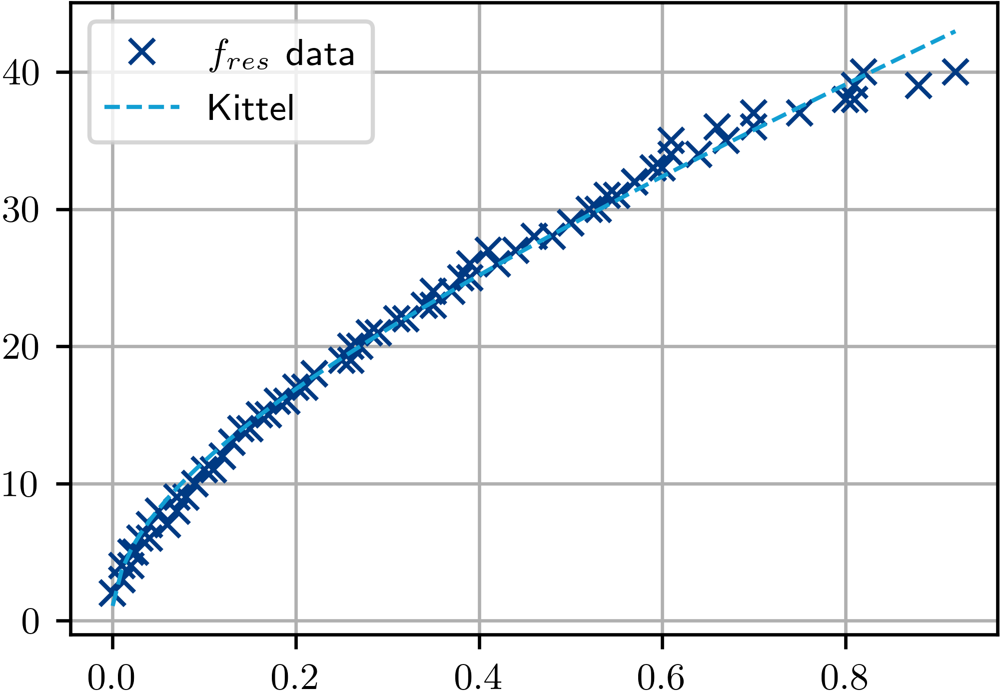

In [60]:
from scipy.optimize import curve_fit
def Kittel(H,gamma,Hk,Ms):
    mu=1.2566e-6 #N/A²
    mur=200
#     gamma=28.025 #GHz/T*2pi
    M=mu*mur*Ms*1000/(4*np.pi) #Oe
    Bk=Hk/1000 #mT
    return np.abs(gamma)*np.sqrt((H+Bk)*(H+Bk+M))

f=np.linspace(2,40,39)
Hplus=np.array([0,10,10,20,30,40,50,70,90,
                100,120,130,140,160,180,200,220,250,260,
                280,310,350,350,380,390,410,460,500,530,
                540,570,590,610,610,660,700,800,810,820])
Hminus=np.array([0,10,20,25,40,60,70,80,90,
                110,120,130,150,170,190,210,220,260,270,
                290,320,340,370,390,420,440,480,500,520,
                550,570,600,640,670,700,750,810,880,920])
H=np.abs(np.concatenate((-Hminus,Hplus)))
ff=np.concatenate((f,f))
hsort=np.argsort(H)

H=H[hsort]/1000
f=ff[hsort]#*2*np.pi#*1e9
popt_Kittel, pcov_Kittel = curve_fit(Kittel,H,f, maxfev=1000000,
       p0=[28, 1e-3,77])
# popt_SWR, pcov_SWR = curve_fit(SWR,H,f, maxfev=1000000,
#        p0=[28, 0,150,1e-4])

plt.plot(H,f, 'x',c=cpd.images(inverse=True)(.75), label='$f_{res}$ data')
plt.plot(H, Kittel(H, *popt_Kittel), '--',
            c=cpd.images(inverse=True)(.5), label='Kittel')
# plt.plot(H, SWR(H, *popt_SWR), '--',
#             c=cpd.images(inverse=False)(.5), label='Kittel + SWR')
plt.legend()
plt.grid()
popt_Kittel,pcov_Kittel

In [61]:
db=FMR_eva.complex_binning(d, Hmin=0,Hmax=1,NH=501)

S21=db['S21']
B=db['H']
f=db['f']
S21_mfrm=np.ones(np.shape(S21), dtype='complex128')
S21_mfrm[S21_mfrm==1]=np.nan
df=15
flim=[2,40]

def Kittel(H,gamma,Hk,Ms):
    mu=1.2566e-6 #N/A²
    mur=200
#     gamma=28.025 #GHz/T*2pi
    M=mu*mur*Ms*1000/(4*np.pi) #Oe
    Bk=Hk/1000 #mT
    return np.abs(gamma)*np.sqrt((H+Bk)*(H+Bk+M))

for i,b in enumerate(B):
    fres=Kittel(b, *popt_Kittel)
    fmin=np.max([fres-df/2,flim[0]])
    fmax=np.min([fres+df/2,flim[1]])
    pos0=np.argmin(np.abs(f-fmin))
    pos1=np.argmin(np.abs(f-fmax))+1
    S21_mfrm[pos0:pos1,i]=S21[pos0:pos1,i]
    
norm_pos=np.ones(np.shape(f)[0])
norm=np.ones((np.shape(f)[0]),dtype='complex128')
for i,eff in enumerate(f):
    ind=np.arange(np.shape(B)[0])
    logic=np.logical_not(np.isnan(S21_mfrm[i,:]))
    n=int(np.max(ind[logic]))
    norm_pos[i]=n
    norm[i]=S21_mfrm[i,n]
    
ones,Norm=np.meshgrid(np.ones(np.shape(B)),norm)
nnorm=norm
    
S21_mfrm=S21_mfrm/Norm
Hm,fm=np.meshgrid(np.nanmean(np.abs(S21_mfrm), axis=0),
                  np.nanmean(np.abs(S21_mfrm), axis=1))
#S21_mfrm=S21_mfrm/Hm/fm

<Figure size 2400x1440 with 0 Axes>

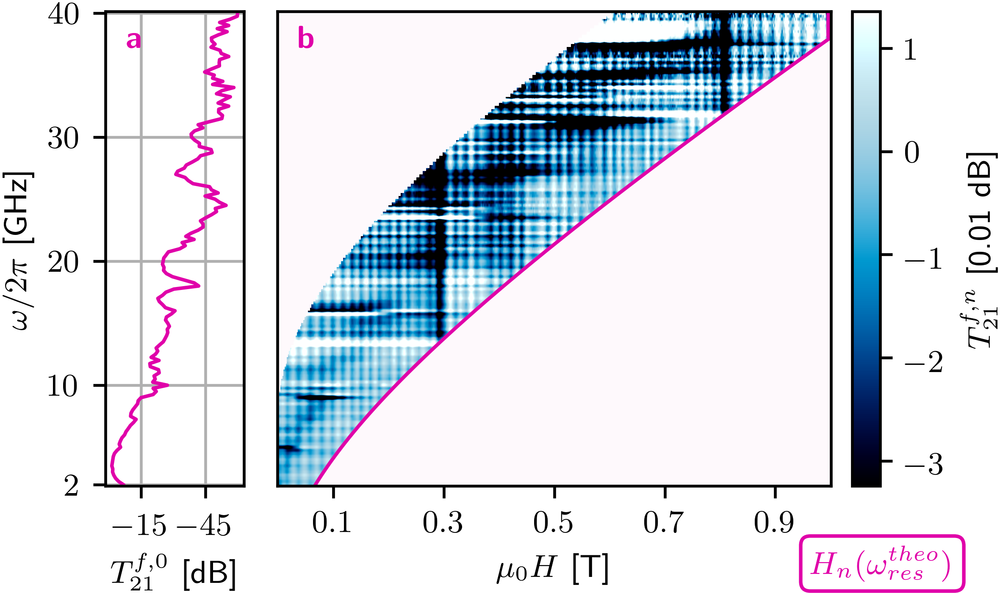

In [62]:

mpl.style.use('thesis_small.mplstyle')

img=20*np.log10(np.abs(S21_mfrm))*100
norm=20*np.log10(np.abs(nnorm))
posN=dn['Hnorm']
H=db['H']
freq=db['f']

Hlim=(-1.5,1.5)
flim=(0,40)
contrast=1
fig_nr=0

xlabel='$\mu_0H$ [T]'
ylabel='$\omega/2\pi$ [GHz]'
nlabel='$T_{21}^{f,0}$ [dB]'
clabel='$T^{f,n}_{21}$ [0.01 dB]'
normticks=[0,-40]
filename=False
subpath=False
    
# correct image framing
stepsizeH=np.abs(H[0]-H[1])/2
stepsizef=np.abs(freq[-1]-freq[-2])/2
Hind=[np.abs(H-Hlim[0]).argmin(),
      np.abs(H-Hlim[1]).argmin()+1]
find=[np.abs(freq-flim[0]).argmin(),
      np.abs(freq-flim[1]).argmin()+1]
img=img[find[0]:find[1],
        Hind[0]:Hind[1]]
ext=[H[Hind[0]]-stepsizeH,
     H[Hind[1]-1]+stepsizeH,
     freq[find[0]]-stepsizef,
     freq[find[1]-1]+stepsizef]
freq=freq[find[0]:find[1]]
H=H[Hind[0]:Hind[1]]

img[img==-np.inf]=np.nan
img[img==np.inf]=np.nan
clim=(np.nanmean(img)-contrast*np.nanstd(img),
      np.nanmean(img)+contrast*np.nanstd(img))

plt.close(fig_nr)
fig=plt.figure(fig_nr)

fig, (ax_norm, ax_img, ax_clb) = plt.subplots(ncols=3,
                                    gridspec_kw={"width_ratios":[1,4,.2]},
                                    constrained_layout=True)        

norm=norm[find[0]:find[1]]
ax_norm.plot(norm,freq,c=cpd.curves(color='magenta')(1))       
ax_norm.set_ylabel(ylabel)
ax_norm.set_xlabel(nlabel)
ax_norm.set_ylim(ext[2],ext[3])
ax_norm.grid()
ax_norm.invert_xaxis()
ax_norm.set_yticks([40,30,20,10,2])

nlim=[np.min(norm),np.max(norm)]
enn=np.abs(nlim[1]-nlim[0])/4
nlim=np.around(([(nlim[0]+enn)*2,(nlim[1]-enn)*2]),decimals=-1)/2
ax_norm.set_xticks(nlim)

# Take care of image and colorbar   
ax_img.set_yticks([])
ax_img.set_yticklabels([])

masked_array = np.ma.array (img, mask=np.isnan(img))
cmap = cpd.images()
cmap.set_bad(cpd.curves(color='magenta')(0),.025)
im = ax_img.imshow(masked_array, 
                   extent=ext, 
                   aspect='auto',
                   origin='lower',
                   clim=clim,
                   cmap=cmap)
ax_img.set_xlabel(xlabel)
ax_img.vlines(posN, ymin=Kittel(1, *popt_Kittel)-df/2, ymax=ext[3], lw=2.5,
             color=cpd.curves(color='magenta')(1),
             label="$H_n=%3.2f\,$T"%float(posN))

#ax_norm.text(nlim[0],ext[2]+(ext[3]-ext[2])/20, rotation='vertical',
fig.text(.805,.045,
            "$H_n(\omega_{res}^{theo})$",
            color=cpd.curves(color='magenta')(1),
            bbox=dict(facecolor='white', 
                      edgecolor=cpd.curves(color='magenta')(1), 
                      boxstyle='round'))
#ax_clb.set_xticks([0])
# ax_clb.set_xlabel("$H_n=%3.2f\,$T"%float(posN),
#              color=cpd.curves(color='seeblau')(1))

ax_img.set_xticks(np.linspace(.1,.9,5))
ax_img.set_xticks(list(ax_img.get_xticks()))
#ax_img.get_xticklabels()[-1].set_color(cpd.images(color='magenta')(.5))

ax_img.plot(H,Kittel(H, *popt_Kittel)-df/2, c=cpd.curves(color='magenta')(1))

ax_img.set_xlim(ext[0],ext[1])
ax_img.set_ylim(ext[2],ext[3])


fig.colorbar(im,label=clabel, cax=ax_clb)
ax_norm.annotate(r'\textbf{a}',xy=(0, 1), xycoords='axes fraction',xytext=(50, -100),color=cpd.curves(color='magenta')(1),
                  textcoords='offset pixels',horizontalalignment='left',verticalalignment='bottom')
ax_img.annotate(r'\textbf{b}',xy=(0, 1), xycoords='axes fraction',xytext=(50, -100),color=cpd.curves(color='magenta')(1),
                  textcoords='offset pixels',horizontalalignment='left',verticalalignment='bottom')

fig.savefig('mrfm.pgf')

<Figure size 2400x1440 with 0 Axes>

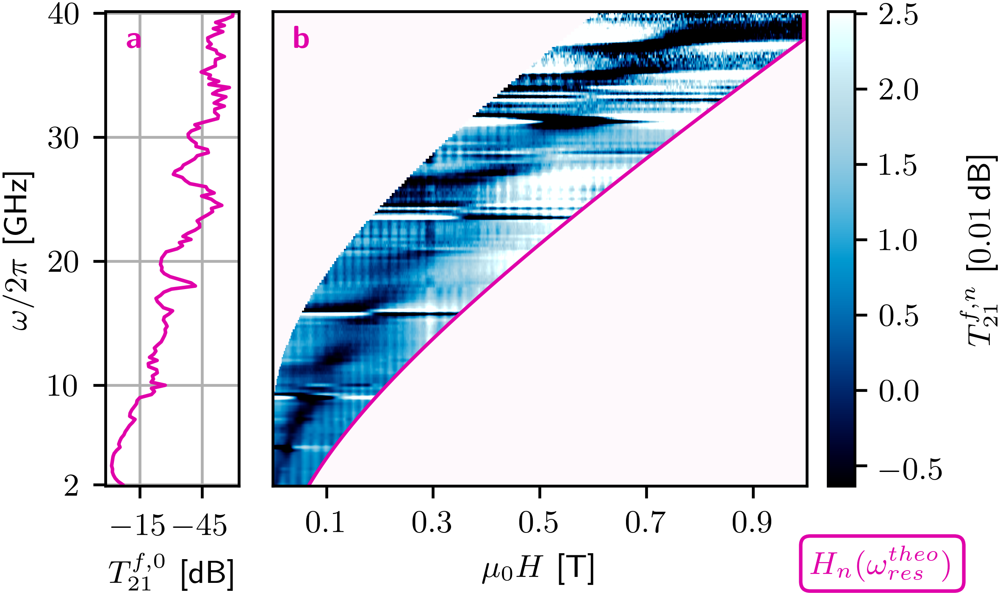

In [63]:

mpl.style.use('thesis_small.mplstyle')

Hm,fm=np.meshgrid(np.nanmean(np.abs(S21_mfrm), axis=0),
                  np.nanmean(np.abs(S21_mfrm), axis=1))
#S21_mfrm=S21_mfrm/Hm/fm
img=20*np.log10(np.abs(S21_mfrm/Hm/fm))*100
norm=20*np.log10(np.abs(nnorm))
posN=dn['Hnorm']
H=db['H']
freq=db['f']

Hlim=(-1.5,1.5)
flim=(0,40)
contrast=1
fig_nr=0

xlabel='$\mu_0H$ [T]'
ylabel='$\omega/2\pi$ [GHz]'
nlabel='$T_{21}^{f,0}$ [dB]'
clabel='$T^{f,n}_{21}$ [$0.01$\,dB]'
normticks=[0,-40]
filename=False
subpath=False
    
# correct image framing
stepsizeH=np.abs(H[0]-H[1])/2
stepsizef=np.abs(freq[-1]-freq[-2])/2
Hind=[np.abs(H-Hlim[0]).argmin(),
      np.abs(H-Hlim[1]).argmin()+1]
find=[np.abs(freq-flim[0]).argmin(),
      np.abs(freq-flim[1]).argmin()+1]
img=img[find[0]:find[1],
        Hind[0]:Hind[1]]
ext=[H[Hind[0]]-stepsizeH,
     H[Hind[1]-1]+stepsizeH,
     freq[find[0]]-stepsizef,
     freq[find[1]-1]+stepsizef]
freq=freq[find[0]:find[1]]
H=H[Hind[0]:Hind[1]]

img[img==-np.inf]=np.nan
img[img==np.inf]=np.nan
clim=(np.nanmean(img)-contrast*np.nanstd(img),
      np.nanmean(img)+contrast*np.nanstd(img))

plt.close(fig_nr)
fig=plt.figure(fig_nr)

fig, (ax_norm, ax_img, ax_clb) = plt.subplots(ncols=3,
                                    gridspec_kw={"width_ratios":[1,4,.2]},
                                    constrained_layout=True)        

norm=norm[find[0]:find[1]]
ax_norm.plot(norm,freq,c=cpd.curves(color='magenta')(1))       
ax_norm.set_ylabel(ylabel)
ax_norm.set_xlabel(nlabel)
ax_norm.set_ylim(ext[2],ext[3])
ax_norm.grid()
ax_norm.invert_xaxis()
ax_norm.set_yticks([40,30,20,10,2])

nlim=[np.min(norm),np.max(norm)]
enn=np.abs(nlim[1]-nlim[0])/4
nlim=np.around(([(nlim[0]+enn)*2,(nlim[1]-enn)*2]),decimals=-1)/2
ax_norm.set_xticks(nlim)

# Take care of image and colorbar   
ax_img.set_yticks([])
ax_img.set_yticklabels([])

masked_array = np.ma.array (img, mask=np.isnan(img))
cmap = cpd.images()
cmap.set_bad(cpd.curves(color='magenta')(0),.025)
im = ax_img.imshow(masked_array, 
                   extent=ext, 
                   aspect='auto',
                   origin='lower',
                   clim=clim,
                   cmap=cmap)
ax_img.set_xlabel(xlabel)
ax_img.vlines(posN, ymin=Kittel(1, *popt_Kittel)-df/2, ymax=ext[3], lw=2.5,
             color=cpd.curves(color='magenta')(1),
             label="$H_n=%3.2f\,$T"%float(posN))

#ax_norm.text(nlim[0],ext[2]+(ext[3]-ext[2])/20, rotation='vertical',
fig.text(.805,.045,
            "$H_n(\omega_{res}^{theo})$",
            color=cpd.curves(color='magenta')(1),
            bbox=dict(facecolor='white', 
                      edgecolor=cpd.curves(color='magenta')(1), 
                      boxstyle='round'))
#ax_clb.set_xticks([0])
# ax_clb.set_xlabel("$H_n=%3.2f\,$T"%float(posN),
#              color=cpd.curves(color='seeblau')(1))

ax_img.set_xticks(np.linspace(.1,.9,5))
ax_img.set_xticks(list(ax_img.get_xticks()))
#ax_img.get_xticklabels()[-1].set_color(cpd.images(color='magenta')(.5))

ax_img.plot(H,Kittel(H, *popt_Kittel)-df/2, c=cpd.curves(color='magenta')(1))

ax_img.set_xlim(ext[0],ext[1])
ax_img.set_ylim(ext[2],ext[3])
ax_norm.annotate(r'\textbf{a}',xy=(0, 1), xycoords='axes fraction',xytext=(50, -100),color=cpd.curves(color='magenta')(1),
                  textcoords='offset pixels',horizontalalignment='left',verticalalignment='bottom')
ax_img.annotate(r'\textbf{b}',xy=(0, 1), xycoords='axes fraction',xytext=(50, -100),color=cpd.curves(color='magenta')(1),
                  textcoords='offset pixels',horizontalalignment='left',verticalalignment='bottom')

fig.colorbar(im,label=clabel, cax=ax_clb)

fig.savefig('mrfm_avg.pgf')

In [64]:
db=FMR_eva.complex_binning(d, Hmin=0, Hmax=1, NH=1000)

In [65]:
dn=FMR_eva.normS21(db, Hnorm='max')

<Figure size 2400x1440 with 0 Axes>

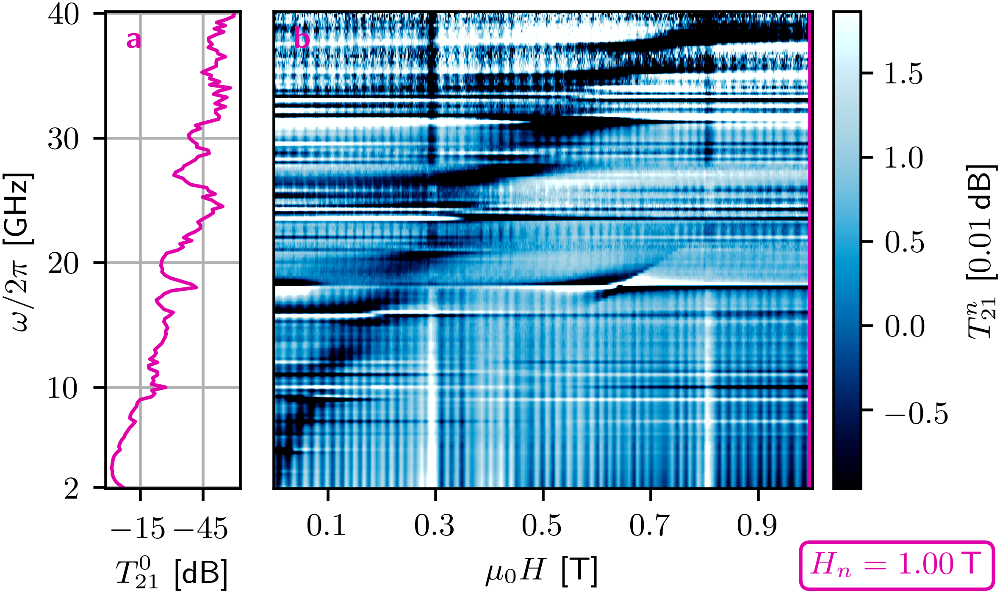

In [66]:

mpl.style.use('thesis_small.mplstyle')

Hm,fm=np.meshgrid(np.nanmean(np.abs(dn['S21']), axis=0),
                  np.nanmean(np.abs(dn['S21']), axis=1))
img=20*np.log10(np.abs(dn['S21']/fm/Hm))*100
norm=20*np.log10(np.abs(dn['S21norm']))
posN=dn['Hnorm']
H=db['H']
freq=db['f']

Hlim=(-1.5,1.5)
flim=(0,40)
contrast=1
fig_nr=0

xlabel='$\mu_0H$ [T]'
ylabel='$\omega/2\pi$ [GHz]'
nlabel='$T_{21}^0$ [dB]'
clabel='$T^n_{21}$ [$0.01$\,dB]'
normticks=[0,-40]
filename=False
subpath=False
    
# correct image framing
stepsizeH=np.abs(H[0]-H[1])/2
stepsizef=np.abs(freq[-1]-freq[-2])/2
Hind=[np.abs(H-Hlim[0]).argmin(),
      np.abs(H-Hlim[1]).argmin()+1]
find=[np.abs(freq-flim[0]).argmin(),
      np.abs(freq-flim[1]).argmin()+1]
img=img[find[0]:find[1],
        Hind[0]:Hind[1]]
ext=[H[Hind[0]]-stepsizeH,
     H[Hind[1]-1]+stepsizeH,
     freq[find[0]]-stepsizef,
     freq[find[1]-1]+stepsizef]
freq=freq[find[0]:find[1]]
H=H[Hind[0]:Hind[1]]

img[img==-np.inf]=np.nan
img[img==np.inf]=np.nan
clim=(np.nanmean(img)-contrast*np.nanstd(img),
      np.nanmean(img)+contrast*np.nanstd(img))

plt.close(fig_nr)
fig=plt.figure(fig_nr)

fig, (ax_norm, ax_img, ax_clb) = plt.subplots(ncols=3,
                                    gridspec_kw={"width_ratios":[1,4,.2]},
                                    constrained_layout=True)        

norm=norm[find[0]:find[1]]
ax_norm.plot(norm,freq,c=cpd.curves(color='magenta')(1))       
ax_norm.set_ylabel(ylabel)
ax_norm.set_xlabel(nlabel)
ax_norm.set_ylim(ext[2],ext[3])
ax_norm.grid()
ax_norm.invert_xaxis()

nlim=[np.min(norm),np.max(norm)]
enn=np.abs(nlim[1]-nlim[0])/4
nlim=np.around(([(nlim[0]+enn)*2,(nlim[1]-enn)*2]),decimals=-1)/2
ax_norm.set_xticks(nlim)
ax_norm.set_yticks([40,30,20,10,2])

# Take care of image and colorbar   
ax_img.set_yticks([])
ax_img.set_yticklabels([])
im = ax_img.imshow(img, 
                   extent=ext, 
                   aspect='auto',
                   origin='lower',
                   clim=clim,
                   cmap=cpd.images())
ax_img.set_xlabel(xlabel)
ax_img.vlines(posN, ymin=ext[2], ymax=ext[3], lw=2.5,
             color=cpd.curves(color='magenta')(1),
             label="$H_n=%3.2f\,$T"%float(posN))

#ax_norm.text(nlim[0],ext[2]+(ext[3]-ext[2])/20, rotation='vertical',
fig.text(.805,.045,
            "$H_n=%3.2f\,$T"%float(posN),
            color=cpd.curves(color='magenta')(1),
            bbox=dict(facecolor='white', 
                      edgecolor=cpd.curves(color='magenta')(1), 
                      boxstyle='round'))
#ax_clb.set_xticks([0])
# ax_clb.set_xlabel("$H_n=%3.2f\,$T"%float(posN),
#              color=cpd.curves(color='seeblau')(1))

ax_img.set_xticks(np.linspace(.1,.9,5))
ax_img.set_xticks(list(ax_img.get_xticks()))
#ax_img.get_xticklabels()[-1].set_color(cpd.images(color='magenta')(.5))

ax_img.set_xlim(ext[0],ext[1])
ax_img.set_ylim(ext[2],ext[3])


fig.colorbar(im,label=clabel, cax=ax_clb)
ax_norm.annotate(r'\textbf{a}',xy=(0, 1), xycoords='axes fraction',xytext=(50, -100),color=cpd.curves(color='magenta')(1),
                  textcoords='offset pixels',horizontalalignment='left',verticalalignment='bottom')
ax_img.annotate(r'\textbf{b}',xy=(0, 1), xycoords='axes fraction',xytext=(50, -100),color=cpd.curves(color='magenta')(1),
                  textcoords='offset pixels',horizontalalignment='left',verticalalignment='bottom')

fig.savefig('raw_avg.pgf')

In [ ]:
np.isnan(img)

In [ ]:
fmr_eva.showimage(20*np.log10(np.abs(S21_mfrm)),dn['H'],dn['f'],
#                   clim=(.9,1),
                  style='thesis_half',
                  xlabel='magnetic field $\mu_0H$ [T]',
                  ylabel='frequency $f$ [GHz]',
                  zlabel='$20\cdot\log_{10}|S_{21}/S_{21}(H_n(\omega))|$ [dB]'%dn['Hnorm'],)